# Benchmark 

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import os
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse

# from matplotlib import font_manager, rcParams
# custom_rc = {
#     'font.family': 'Arial',  # Set the desired font for this plot
# }

# mpl.rcParams['svg.fonttype'] = 'none'
# mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "dkd_Wilson"
file_name = "dkd_Wilson"
file_suffix = time.strftime('%b%d-%H%M')

# save_dir = Path(f"../save/{proj_name}-{file_suffix}")
# save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

In [4]:
# load the data
adata = sc.read_h5ad(data_dir / f"{file_name}.h5ad")

In [9]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'schema_reference', 'schema_version', 'title'


In [10]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=5000, subset=False)
sc.tl.pca(adata, n_comps=300, svd_solver='arpack', use_highly_variable=True)
adata = adata[:, adata.var.highly_variable].copy()

In [12]:
# Add raw counts to adata.layers["counts"] after HVG filtering
if adata.raw is not None:
    adata.layers["counts"] = adata.raw[:, adata.var_names].X.astype(np.int32)
    print("✅ counts layer set from adata.raw (shape matched to HVGs)")
else:
    raise ValueError("❌ adata.raw is None — cannot set counts layer.")


✅ counts layer set from adata.raw (shape matched to HVGs)


In [14]:
import numpy as np

zero_expression = np.array(adata.X.sum(axis=1)).flatten() == 0
n_zero_cells = np.sum(zero_expression)

print(f"❗ {n_zero_cells} cells have 0 expression in `adata.X`")


❗ 0 cells have 0 expression in `adata.X`


In [15]:
# import pandas as pd

batch_key = 'donor_id'  # or your actual batch column in adata.obs
for batch in adata.obs[batch_key].unique():
    sub = adata[adata.obs[batch_key] == batch]
    X = sub.X.toarray() if sparse.issparse(sub.X) else sub.X
    zero_var = np.sum(np.var(X, axis=0) == 0)
    print(f"{batch}: {zero_var} zero-variance genes")


control_1: 401 zero-variance genes
control_2: 711 zero-variance genes
control_3: 285 zero-variance genes
healthy_4: 750 zero-variance genes
healthy_5: 717 zero-variance genes
diabetic_1: 464 zero-variance genes
diabetic_2: 480 zero-variance genes
diabetic_3: 537 zero-variance genes
diabetic_4: 853 zero-variance genes
diabetic_5: 931 zero-variance genes
healthy_6: 141 zero-variance genes


In [5]:
min_val = adata.X.min()
print(f"🔍 Minimum value in adata.X: {min_val}")

max_val = adata.X.max()
print(f"🔍 Maximum value in adata.X: {max_val}")

if min_val < 0:
    print("⚠️ adata.X is scaled — contains negative values.")
else:
    print("✅ adata.X is non-negative — likely log1p transformed, not scaled.")


🔍 Minimum value in adata.X: 0.0
🔍 Maximum value in adata.X: 7.346010208129883
✅ adata.X is non-negative — likely log1p transformed, not scaled.


In [14]:
counts = adata.layers["counts"]
if counts is None:
    print("❌ adata.layers['counts'] does not exist.")
else:
    # Check min and integer-ness
    if sparse.issparse(counts):
        counts = counts.data  # only nonzero values
    else:
        counts = counts.flatten()

    min_val = counts.min()
    is_integer = np.allclose(counts, np.round(counts))

    print(f"🔍 counts layer — min: {min_val}, integer-like: {is_integer}")
    if min_val < 0:
        print("❌ counts layer contains negative values!")
    elif not is_integer:
        print("❌ counts layer contains non-integer values!")
    else:
        print("✅ counts layer looks valid: non-negative integers.")


🔍 counts layer — min: 1, integer-like: True
✅ counts layer looks valid: non-negative integers.


In [17]:
# save the adata object
adata.write_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")
print(f"✅ Preprocessed data saved to {data_dir / f'{file_name}_preprocessed.h5ad'}")

✅ Preprocessed data saved to ../data/dkd_Wilson/dkd_Wilson_preprocessed.h5ad


In [4]:
adata = sc.read_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")

# Liger debug

In [5]:
adata

AnnData object with n_obs × n_vars = 39176 × 10000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    u

In [6]:
import numpy as np
import pyliger
from scipy.sparse import csr_matrix

In [7]:
batch_key = 'donor_id'  # or your actual batch column in adata.obs
count_layer="counts",
output_key="LIGER", 

In [8]:
batch_key = batch_key[0] if isinstance(batch_key, tuple) else batch_key
count_layer = count_layer[0] if isinstance(count_layer, tuple) else count_layer
output_key = output_key[0] if isinstance(output_key, tuple) else output_key

In [9]:
k=30, 
return_corrected=False

bdata = adata.copy()
if not bdata.obs[batch_key].dtype.name == "category":
    bdata.obs[batch_key] = bdata.obs[batch_key].astype("category")
batch_cats = bdata.obs[batch_key].cat.categories

bdata.X = bdata.layers[count_layer]
if not isinstance(bdata.X, csr_matrix):
    bdata.X = csr_matrix(bdata.X)

adata_list = [bdata[bdata.obs[batch_key] == b].copy() for b in batch_cats]
for i, ad in enumerate(adata_list):
    ad.uns["sample_name"] = batch_cats[i]
    ad.uns["var_gene_idx"] = np.arange(bdata.n_vars)

In [10]:
adata_list

[AnnData object with n_obs × n_vars = 3605 × 10000
     obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
     var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
   

In [12]:
for ad in adata_list:
    if ad.obs.index.name is None:
        ad.obs.index.name = "cell"
    if ad.var.index.name is None:
        ad.var.index.name = "gene"


In [18]:
# liger_data = pyliger.create_liger(adata_list, remove_missing=False, make_sparse=False)
liger_data = pyliger.create_liger(adata_list)
liger_data.var_genes = bdata.var_names

In [19]:
pyliger.normalize(liger_data)
pyliger.select_genes(liger_data)
pyliger.scale_not_center(liger_data)

In [ ]:
pyliger.optimize_ALS(liger_data, k = k)

100%|██████████| 30/30 [10:51<00:00, 21.73s/it]


In [24]:
pyliger.quantile_norm(liger_data)

In [25]:
liger_data.adata_list[0]

AnnData object with n_obs × n_vars = 3605 × 5687
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'nUMI', 'nGene', 'dataset', 'cluster'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means'

In [26]:
liger_data.adata_list[0].obsm["H_norm"].shape[1]

20

In [ ]:
# Initialize the obsm field for the integrated data
adata.obsm[output_key] = np.zeros((adata.shape[0], liger_data.adata_list[0].obsm["H"].shape[1]))

# Populate the integrated embeddings back into the main AnnData object
for i, b in enumerate(batch_cats):
    adata.obsm[output_key][adata.obs[batch_key] == b] = liger_data.adata_list[i].obsm["H"]

# Liger debug end here

In [5]:
import subprocess, json
methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]

# concord_args = {
#     "encoder_dims": [512, 256],
#     "beta": 0.1,
#     "n_epochs": 10
# }

output_dir = '../jobs'
device = 'auto'
conda_env = 'concord_env'
batch_key = 'donor_id'
state_key = 'cell_type'
latent_dim = '50'  # Adjust as needed, but should match the encoder_dims in concord_args

mode = 'local'

subprocess.run([
    "python", "./generate_py_sh_jobs.py",
    "--proj_name", proj_name,
    "--adata_filename", f"{file_name}_preprocessed.h5ad",
    "--methods", *methods,
    "--batch_key", batch_key,
    "--state_key", state_key,
    "--latent_dim", latent_dim,
    "--output_dir", output_dir,
    "--device", device,
    "--conda_env", conda_env,
    "--runtime", "02:00:00",
    "--mode", mode,
    # "--concord_kwargs", json.dumps(concord_args)
], check=True)

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scvi.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scvi.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_harmony.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_harmony.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scanorama.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scanorama.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_liger.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_liger.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_unintegrated.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_unintegrated.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_hcl.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_hcl.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_knn.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_knn.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_W

CompletedProcess(args=['python', './generate_py_sh_jobs.py', '--proj_name', 'dkd_Wilson', '--adata_filename', 'dkd_Wilson_preprocessed.h5ad', '--methods', 'scvi', 'harmony', 'scanorama', 'liger', 'unintegrated', 'concord_hcl', 'concord_knn', 'contrastive', '--batch_key', 'donor_id', '--state_key', 'cell_type', '--latent_dim', '50', '--output_dir', '../jobs', '--device', 'auto', '--conda_env', 'concord_env', '--runtime', '02:00:00', '--mode', 'local'], returncode=0)

In [6]:
proj_folder = Path(output_dir) / f"benchmark_{proj_name}"
proj_folder.mkdir(parents=True, exist_ok=True)  # defensive

submit_all = proj_folder / f"submit_all_{proj_name}.sh"

with submit_all.open("w") as f:
    f.write("#!/bin/bash\n")
    f.write("# Auto-generated — sequentially runs every job script\n")
    f.write('cd "$(dirname "$0")"\n\n')
    f.write("timestamp=$(date +'%m%d-%H%M')\n\n")

    for sh_file in sorted(proj_folder.glob(f"benchmark_{proj_name}_*.sh")):
        base = sh_file.stem
        f.write(f"echo '🔄 Running: {sh_file.name} (log: {base}_${{timestamp}}.log)'\n")
        f.write(f"bash {sh_file.name} > {base}_${{timestamp}}.log 2>&1\n")
        f.write("echo '✅ Done.'\n\n")

submit_all.chmod(0o755)
print(f"📌  Next step: Run “{submit_all}” to execute all jobs sequentially.")

📌  Next step: Run “../jobs/benchmark_dkd_Wilson/submit_all_dkd_Wilson.sh” to execute all jobs sequentially.


In [ ]:
# Run “../jobs/benchmark_dkd_Wilson/submit_all_dkd_Wilson.sh”
!bash ../jobs/benchmark_dkd_Wilson/submit_all_dkd_Wilson.sh

In [7]:
!cd ../jobs/benchmark_dkd_Wilson/ && python benchmark_dkd_Wilson_liger.py

2025-07-01 06:44:39,384 - INFO - Using device: cuda
2025-07-01 06:44:39,405 - INFO - Using GPU 0: Tesla T4
2025-07-01 06:44:39,406 - INFO - Logging to: ../../save/dkd_Wilson/liger_0701-0644/run.log
2025-07-01 06:44:39,406 - INFO - Starting integration pipeline...
2025-07-01 06:44:40,497 - INFO - Loaded AnnData from: ../../data/dkd_Wilson/dkd_Wilson_preprocessed.h5ad
2025-07-01 06:44:49,277 - INFO - /home/ec2-user/miniconda3/envs/concord_env/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:344: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
2025-07-01 06:44:49,325 - INFO - /home/ec2-user/miniconda3/envs/concord_env/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:344: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling

In [8]:
# map the obsm back to the adata 
# for each method, uses the most recent run (based on timestamp)
# methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]
# methods = ["scvi", "harmony", "scanorama", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]
methods = ["liger"]

from benchmark_utils import add_embeddings

adata = add_embeddings(adata, proj_name=proj_name, methods=methods)



✅ obsm['liger'] loaded


In [20]:
save_dir = Path(f"../save/{proj_name}-{file_suffix}")
save_dir.mkdir(parents=True, exist_ok=True)

In [21]:
for method in methods:
    if f"{method}_UMAP" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 2D UMAP for {method}...")
        ccd.ul.run_umap(adata, source_key=f"{method}", result_key=f"{method}_UMAP", n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP'] computed")
    if f"{method}_UMAP_3D" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP_3D'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 3D UMAP for {method}...")
        ccd.ul.run_umap(adata,source_key=f"{method}",result_key=f"{method}_UMAP_3D",n_components=3,  min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP_3D'] computed")

ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")
print(f"✅ Embeddings saved to {save_dir / f'obsm_{file_suffix}.h5'}")
final_path = data_dir / f"{file_name}_final.h5ad"
adata.write_h5ad(final_path)
print(f"✅ Final AnnData saved to: {final_path}")

Computing 2D UMAP for liger...
Concord - INFO - UMAP embedding stored in adata.obsm['liger_UMAP']
✅ obsm['liger_UMAP'] computed
Computing 3D UMAP for liger...
Concord - INFO - UMAP embedding stored in adata.obsm['liger_UMAP_3D']
✅ obsm['liger_UMAP_3D'] computed
✅ Embeddings saved to ../save/dkd_Wilson-Jul01-0641/obsm_Jul01-0641.h5
✅ Final AnnData saved to: ../data/dkd_Wilson/dkd_Wilson_final.h5ad


In [23]:
adata

AnnData object with n_obs × n_vars = 39176 × 10000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    u

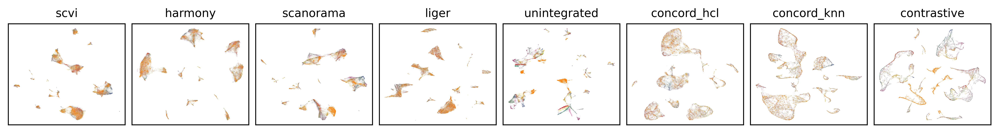

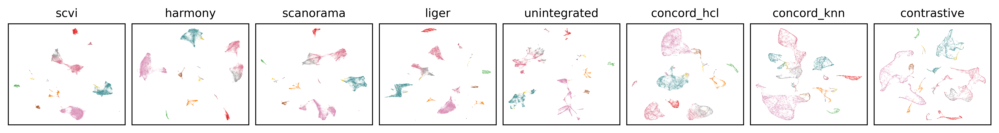

In [26]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = ['donor_id', 'cell_type']
basis_types = ['UMAP']

font_size=10
point_size=.1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'donor_id': 'Set1', 
       'cell_type': 'Set1'}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


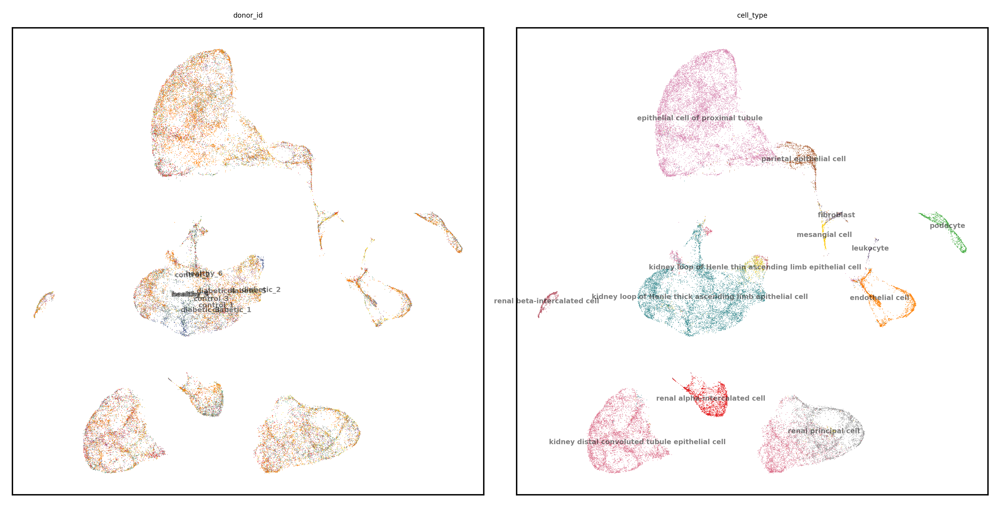

In [20]:
output_key = 'concord_hcl'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,4), dpi=600, ncols=2, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

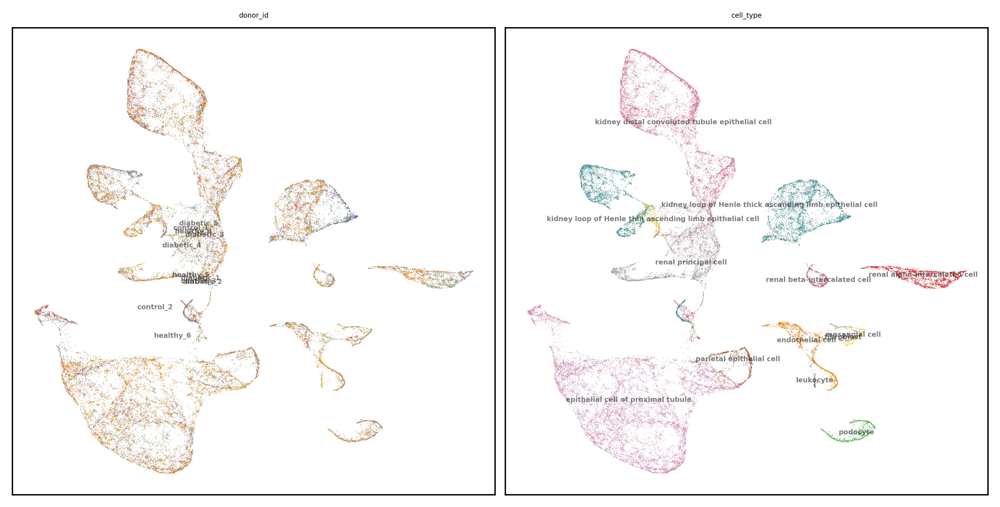

In [21]:
output_key = 'concord_knn'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,4), dpi=600, ncols=2, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

In [24]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='cel')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

VisCello project created at ../data/dkd_Wilson/cello_dkd_Wilson_Jun30-0233
Saved viscello to ../data/dkd_Wilson/cello_dkd_Wilson_Jun30-0233


# Benchmarking

In [4]:
adata = sc.read_h5ad(data_dir / f"{file_name}_final.h5ad")

✅ Benchmark summary saved to: ../save/dkd_Wilson-Jul01-0641/benchmark_summary_Jul01-0641.tsv


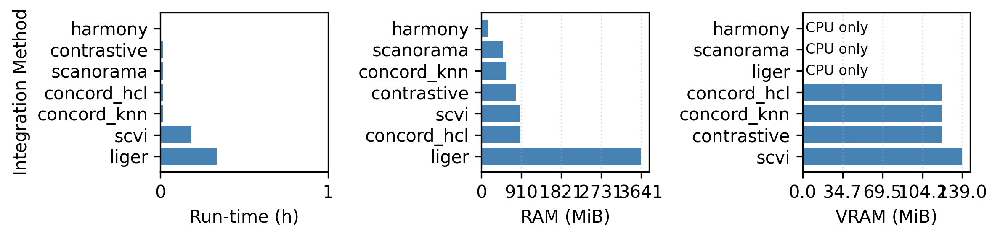

In [27]:
from benchmark_utils import collect_benchmark_logs
bench_df = collect_benchmark_logs("dkd_Wilson", methods)
# Save the benchmark results
bench_df.to_csv(save_dir / f"benchmark_summary_{file_suffix}.tsv", sep="\t", index=False)
print(f"✅ Benchmark summary saved to: {save_dir / f'benchmark_summary_{file_suffix}.tsv'}")
# Plot benchmark results
from benchmark_utils import plot_benchmark_performance
import matplotlib.pyplot as plt
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}
with plt.rc_context(rc=custom_rc):
    plot_benchmark_performance(bench_df, figsize=(8,2), dpi=300, save_path = save_dir / f"benchmark_plot_{file_suffix}.pdf")


In [8]:
batch_key = 'donor_id'
state_key = 'cell_type'
methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]

Embeddings: 100%|██████████| 8/8 [05:49<00:00, 43.64s/it]


Detected task: classification
Detected task: classification
[KNN] detected task: classification
[KNN] detected task: classification


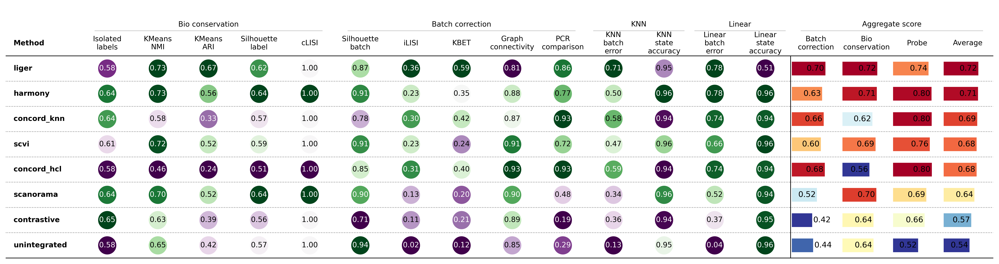

✅ Benchmark results saved to: ../save/dkd_Wilson-Jul01-0801/benchmark_cell_type_Jul01-0801.pkl


In [9]:
state_key = state_key
batch_key = batch_key
save_dir = Path(f"../save/{proj_name}-{file_suffix}")
out = ccd.bm.run_benchmark_pipeline(
    adata,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_celltype",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("scib","probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_celltype = out["combined"]

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")

In [10]:
combined_celltype

Bio conservation                                               \
              Isolated labels KMeans NMI KMeans ARI Silhouette label cLISI   
liger                0.583684   0.731406   0.673607          0.62191   1.0   
harmony              0.640932   0.728216   0.561567         0.641197   1.0   
concord_knn          0.636441   0.576157   0.328332         0.570278   1.0   
scvi                 0.606174   0.724903   0.516283         0.586707   1.0   
concord_hcl          0.577418   0.461578   0.243153         0.513344   1.0   
scanorama            0.640729   0.704602   0.524535         0.641069   1.0   
contrastive          0.648041   0.625353    0.38975         0.560447   1.0   
unintegrated         0.576369   0.648961   0.416842         0.574453   1.0   

             Batch correction                                         \
             Silhouette batch     iLISI      KBET Graph connectivity   
liger                0.867836  0.356055  0.587341            0.81405   
harmony              0.909609  0.229758  0.354049           0.884453   
concord_knn           0.78259   0.30025  0.418517           0.874121   
scvi                 0.906315  0.227908  0.237054           0.914114   
concord_hcl          0.849496  0.309179  0.397535           0.926325   
scanorama            0.895806  0.128522  0.198529           0.904845   
contrastive          0.707207   0.11089  0.213408           0.886645   
unintegrated         0.939747   0.01867   0.12032           0.848062   

                                     KNN                       Linear  \
             PCR comparison batch\nerror state\naccuracy batch\nerror   
liger              0.861673     0.709035        0.947677     0.782004   
harmony            0.768898     0.499745        0.960439     0.776260   
concord_knn        0.932739     0.581802        0.944104     0.737588   
scvi               0.721538     0.471159        0.955590     0.661646   
concord_hcl        0.934144     0.594053        0.943594     0.742948   
scanorama          0.477618     0.344691        0.958142     0.520996   
contrastive         0.18836     0.362813        0.943849     0.368602   
unintegrated       0.287345     0.129020        0.952782     0.037013   

                              Aggregate score                             \
             state\naccuracy Batch correction Bio conservation     Probe   
liger               0.507722         0.697391         0.722121  0.736610   
harmony             0.958775         0.629354         0.714383  0.798805   
concord_knn         0.939375         0.661643         0.622241  0.800717   
scvi                0.955712         0.601386         0.686813  0.761027   
concord_hcl         0.938098         0.683336         0.559099  0.804673   
scanorama           0.942055         0.521064         0.702187  0.691471   
contrastive         0.945246         0.421302         0.644718  0.655127   
unintegrated        0.957116         0.442829         0.643325  0.518983   

                        
               Average  
liger         0.718707  
harmony        0.71418  
concord_knn   0.694867  
scvi          0.683075  
concord_hcl   0.682369  
scanorama     0.638241  
contrastive   0.573716  
unintegrated  0.535045

# Seurat